# Proyecto Uber

## Predicción de demanda de Uber

El objetivo de este proyecto es predecir la demanda de Uber en New York en función de la
hora utilizando datos históricos. Para eso se utilizarán datos de 4.5 millones de pickups de
Uber.
Datos: http://bit.ly/2wpe260

## Datos

Este directorio contiene datos sobre más de 4,5 millones de recolecciones de Uber en la ciudad de Nueva York de abril a septiembre de 2014, y 14,3 millones más de recolecciones de Uber de enero a junio de 2015. También incluye datos a nivel de viaje de otras 10 compañías de vehículos de alquiler (FHV). como datos agregados para 329 empresas FHV, también se incluye. Todos los archivos están tal como se recibieron el 3 de agosto, el 15 de septiembre y el 22 de septiembre de 2015.

FiveThirtyEight obtuvo los datos de la Comisión de Taxis y Limusinas de la Ciudad de Nueva York (TLC) al enviar una solicitud de la Ley de Libertad de Información el 20 de julio de 2015. La TLC nos ha enviado los datos en lotes mientras continúa revisando los datos de viaje que Uber y otras compañías de HFV han sometido a ella. La correspondencia de la TLC con FiveThirtyEight se incluye en los archivos TLC_letter.pdf, TLC_letter2.pdf y TLC_letter3.pdf. Las solicitudes de registros de TLC se pueden hacer aquí.

Estos datos se usaron para cuatro historias de FiveThirtyEight: Uber presta servicios a los distritos exteriores de Nueva York más que los taxis, el transporte público debería ser el nuevo mejor amigo de Uber, Uber está quitando millones de viajes en Manhattan a los taxis y Uber está generando tráfico en las horas pico de la ciudad de Nueva York ¿Peor?.

### The dataset contains, roughly, four groups of files:

- Uber trip data from 2014 (April - September), separated by month, with detailed location information
- Uber trip data from 2015 (January - June), with less fine-grained location information
- non-Uber FHV (For-Hire Vehicle) trips. The trip information varies by company, but can include day of trip, time of trip, pickup location, driver's for-hire license number, and vehicle's for-hire license number.
- aggregate ride and vehicle statistics for all FHV companies (and, occasionally, for taxi companies)

### Columnas Archivos 2014

- Date/Time : The date and time of the Uber pickup
- Lat : The latitude of the Uber pickup
- Lon : The longitude of the Uber pickup
- Base : The TLC base company code affiliated with the Uber pickup


## Librerias

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import train_test_split
import geopy
from sklearn.cluster import KMeans

In [2]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)

## Lectura Archivos Año 2014 y 2015

In [3]:
archivos2014 =['uber-raw-data-may14.csv',
                'uber-raw-data-apr14.csv',
                'uber-raw-data-jul14.csv',
                'uber-raw-data-jun14.csv',
                'uber-raw-data-sep14.csv',
                'uber-raw-data-aug14.csv']
df2014 = pd.DataFrame()
for file in archivos2014:
    df = pd.read_csv(file,encoding='utf-8')
    df2014 = pd.concat([df,df2014])

In [4]:
df2015 = pd.read_csv("uber-raw-data-janjune-15.csv")

In [5]:
## Respaldo en excel
#df2014.to_excel('DF2014.xlsx', index=False)

In [6]:
df2014.head(5)

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.73660,-73.99060,B02512
1,8/1/2014 0:09:00,40.72600,-73.99180,B02512
2,8/1/2014 0:12:00,40.72090,-74.05070,B02512
3,8/1/2014 0:12:00,40.73870,-73.98560,B02512
4,8/1/2014 0:12:00,40.73230,-74.00770,B02512


In [14]:
df2014.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 652434
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   Date/Time  4534327 non-null  object 
 1   Lat        4534327 non-null  float64
 2   Lon        4534327 non-null  float64
 3   Base       4534327 non-null  object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [15]:
df2015.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Non-Null Count     Dtype 
---  ------                --------------     ----- 
 0   Dispatching_base_num  14270479 non-null  object
 1   Pickup_date           14270479 non-null  object
 2   Affiliated_base_num   14108284 non-null  object
 3   locationID            14270479 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 435.5+ MB


In [16]:
df2015 = df2015.rename(columns={'Pickup_date':'Date/Time', 'Dispatching_base_num': 'Base Num' })

In [17]:
df2014['Date/Time'] = pd.to_datetime(df2014['Date/Time'], format="%m/%d/%Y %H:%M:%S")
df2015['Date/Time'] = pd.to_datetime(df2015['Date/Time'], format="%Y/%m/%d %H:%M:%S")

In [18]:
## Año 2014
df2014['DiaSemana'] = df2014['Date/Time'].dt.dayofweek
df2014['DiaMes'] = df2014['Date/Time'].dt.day
df2014['Hora'] = df2014['Date/Time'].dt.hour
df2014['DiaNombre'] = df2014['Date/Time'].dt.day_name()
df2014['Mes'] = df2014['Date/Time'].dt.month
## Año 2015
df2015['DiaSemana'] = df2015['Date/Time'].dt.dayofweek
df2015['DiaMes'] = df2015['Date/Time'].dt.day
df2015['Hora'] = df2015['Date/Time'].dt.hour
df2015['DiaNombre'] = df2015['Date/Time'].dt.day_name()
df2015['Mes'] = df2015['Date/Time'].dt.month

In [19]:
df2014.head(5)

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes
0,2014-08-01 00:03:00,40.73660,-73.99060,B02512,4,1,0,Friday,8
1,2014-08-01 00:09:00,40.72600,-73.99180,B02512,4,1,0,Friday,8
2,2014-08-01 00:12:00,40.72090,-74.05070,B02512,4,1,0,Friday,8
3,2014-08-01 00:12:00,40.73870,-73.98560,B02512,4,1,0,Friday,8
4,2014-08-01 00:12:00,40.73230,-74.00770,B02512,4,1,0,Friday,8


In [20]:
#Contar los duplicados
df2014.duplicated().sum()

82581

Eliminamos los duplicados

In [21]:
df2014.drop_duplicates(inplace=True)
df2015.drop_duplicates(inplace=True)

In [22]:
df2014.shape

(4451746, 9)

## Análisis Exploratorio

In [23]:
df2014.describe()

,Lat,Lon,DiaSemana,DiaMes,Hora,Mes
count,4451746.00000,4451746.00000,4451746.00000,4451746.00000,4451746.00000,4451746.00000
mean,40.73924,-73.97304,2.96763,15.93756,14.21754,6.82331
std,0.03984,0.05722,1.87615,8.74571,5.95758,1.70388
min,39.65690,-74.92900,0.00000,1.00000,0.00000,4.00000
25%,40.72110,-73.99650,1.00000,9.00000,10.00000,5.00000
50%,40.74220,-73.98340,3.00000,16.00000,15.00000,7.00000
75%,40.76100,-73.96530,5.00000,23.00000,19.00000,8.00000
max,42.11660,-72.06660,6.00000,31.00000,23.00000,9.00000


<AxesSubplot:xlabel='DiaMes'>

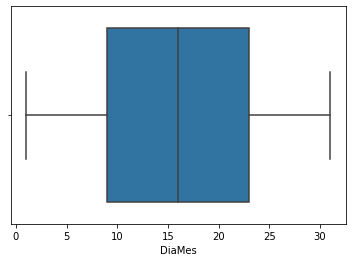

In [24]:
#sns.boxplot(x=df2014["Lat"])
#sns.boxplot(x=df2014["Lon"])
#sns.boxplot(x=df2014["DiaSemana"])
sns.boxplot(x=df2014["DiaMes"])
#sns.boxplot(x=df2014["Hora"])
#sns.boxplot(x=df2014["Mes"])

In [25]:
df2014.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4451746 entries, 0 to 652434
Data columns (total 9 columns):
 #   Column     Non-Null Count    Dtype         
---  ------     --------------    -----         
 0   Date/Time  4451746 non-null  datetime64[ns]
 1   Lat        4451746 non-null  float64       
 2   Lon        4451746 non-null  float64       
 3   Base       4451746 non-null  object        
 4   DiaSemana  4451746 non-null  int64         
 5   DiaMes     4451746 non-null  int64         
 6   Hora       4451746 non-null  int64         
 7   DiaNombre  4451746 non-null  object        
 8   Mes        4451746 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(4), object(2)
memory usage: 339.6+ MB


In [26]:
df2014.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
DiaSemana    0
DiaMes       0
Hora         0
DiaNombre    0
Mes          0
dtype: int64

In [27]:
df2014.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
DiaSemana    0
DiaMes       0
Hora         0
DiaNombre    0
Mes          0
dtype: int64

Cambiamos el número de los días de la semana

In [28]:
##Año 2014
df2014['DiaSemana'] = df2014['DiaSemana'].replace(6, 7)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(5, 6)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(4, 5)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(3, 4)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(2, 3)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(1, 2)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(0, 1)
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Monday', 'Lunes')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Tuesday', 'Martes')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Wednesday', 'Miercoles')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Thursday', 'Jueves')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Friday', 'Viernes')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Saturday', 'Sábado')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Sunday', 'Domingo')
##Año 2015
df2015['DiaSemana'] = df2015['DiaSemana'].replace(6, 7)
df2015['DiaSemana'] = df2015['DiaSemana'].replace(5, 6)
df2015['DiaSemana'] = df2015['DiaSemana'].replace(4, 5)
df2015['DiaSemana'] = df2015['DiaSemana'].replace(3, 4)
df2015['DiaSemana'] = df2015['DiaSemana'].replace(2, 3)
df2015['DiaSemana'] = df2015['DiaSemana'].replace(1, 2)
df2015['DiaSemana'] = df2015['DiaSemana'].replace(0, 1)
df2015['DiaNombre'] = df2015['DiaNombre'].replace('Monday', 'Lunes')
df2015['DiaNombre'] = df2015['DiaNombre'].replace('Tuesday', 'Martes')
df2015['DiaNombre'] = df2015['DiaNombre'].replace('Wednesday', 'Miercoles')
df2015['DiaNombre'] = df2015['DiaNombre'].replace('Thursday', 'Jueves')
df2015['DiaNombre'] = df2015['DiaNombre'].replace('Friday', 'Viernes')
df2015['DiaNombre'] = df2015['DiaNombre'].replace('Saturday', 'Sábado')
df2015['DiaNombre'] = df2015['DiaNombre'].replace('Sunday', 'Domingo')

In [29]:
def esFinde(dia):
    if dia > 5:
        return 1
    else:
        return 0

### Creamos atributos es fin de semana

In [30]:
df2014['EsFDS'] = df2014['DiaSemana'].apply(esFinde)

In [31]:
df2014.head()

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes,EsFDS
0,2014-08-01 00:03:00,40.73660,-73.99060,B02512,5,1,0,Viernes,8,0
1,2014-08-01 00:09:00,40.72600,-73.99180,B02512,5,1,0,Viernes,8,0
2,2014-08-01 00:12:00,40.72090,-74.05070,B02512,5,1,0,Viernes,8,0
3,2014-08-01 00:12:00,40.73870,-73.98560,B02512,5,1,0,Viernes,8,0
4,2014-08-01 00:12:00,40.73230,-74.00770,B02512,5,1,0,Viernes,8,0


### Cantidad de viajes por día

In [32]:
df2014.groupby(['DiaSemana', 'DiaNombre']).size().reset_index(name='Cantidad')

,DiaSemana,DiaNombre,Cantidad
0,1,Lunes,532133
1,2,Martes,651753
2,3,Miercoles,683604
3,4,Jueves,741372
4,5,Viernes,727532
5,6,Sábado,634194
6,7,Domingo,481158


<AxesSubplot:>

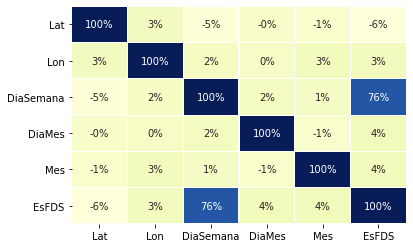

In [33]:
#plt.figure(figsize=(14,14))
sns.heatmap(df2014.iloc[:,[1,2,3,4,5,8,9]].corr(), annot = True, fmt='.0%', linewidths=.1, cmap="YlGnBu", cbar=False)
#sns.heatmap(df2015.iloc[:,[1,2,3,4,5,6,8,9]].corr(), annot = True, fmt='.0%', linewidths=.1, cmap="YlGnBu", cbar=False)
#df2014.iloc[:,[1,2,3,4,5,8]]

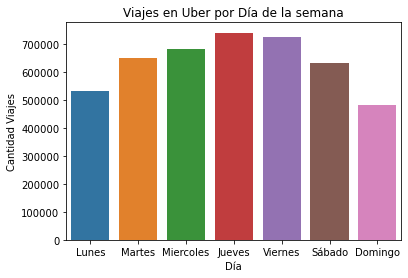

In [34]:
plt.figure(figsize=(6,4))
order_day = ['Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
sns.countplot(data=df2014,x='DiaNombre', order = order_day)
plt.ylabel('Cantidad Viajes')
plt.xlabel('Día')
plt.title('Viajes en Uber por Día de la semana')
plt.show()

In [35]:
Count_FDS = df2014['EsFDS'].value_counts()
print(Count_FDS)
list = ["Día Laboral", "Fin de Semana"]
#print(list_diagnosis)

0    3336394
1    1115352
Name: EsFDS, dtype: int64


<function matplotlib.pyplot.show(close=None, block=None)>

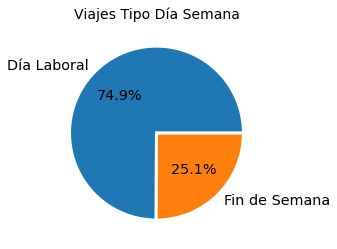

In [36]:
plt.subplots(figsize=(4, 4))
plt.pie(Count_FDS, labels= list, autopct='%.1f%%', wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
        textprops={'size': 'x-large'})
plt.title("Viajes Tipo Día Semana", fontsize = 14)
plt.show

#### Viajes por Mes

In [37]:
df2014.groupby(['Mes']).size().reset_index(name='Cantidad')

,Mes,Cantidad
0,4,556767
1,5,642360
2,6,653158
3,7,781969
4,8,813393
5,9,1004099


In [38]:
#df2014['Mes'].value_counts()

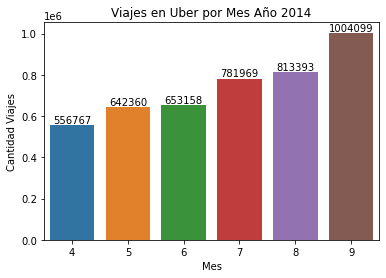

In [39]:
plt.figure(figsize=(6,4))
ax = sns.countplot(data=df2014,x='Mes')
plt.ylabel('Cantidad Viajes')
plt.xlabel('Mes')
plt.title ('Viajes en Uber por Mes Año 2014')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width()/2.0,rect.get_height(),int(rect.get_height()), ha='center', va='bottom')
plt.show()

### Viajes por Hora y Mes

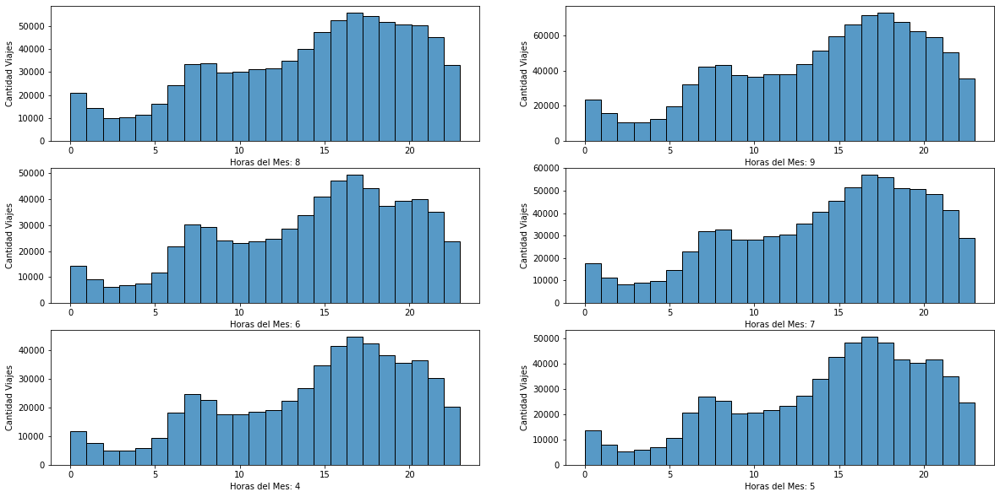

In [40]:
plt.figure(figsize=(20,10))
for i,mes in enumerate(df2014['Mes'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=df2014,x=df2014[df2014['Mes'] == mes]['Hora'],bins=24)
    plt.xlabel('Horas del Mes: {}'.format(mes))
    plt.ylabel('Cantidad Viajes')

- Visualizamos que la cantidad de viajes es similar en todos los meses
- Entre las 14 y 22 horas es la mayor demanda de viajes
- Entre las 0 y 5 horas es baja la demanda

### Viajes por Día Mes

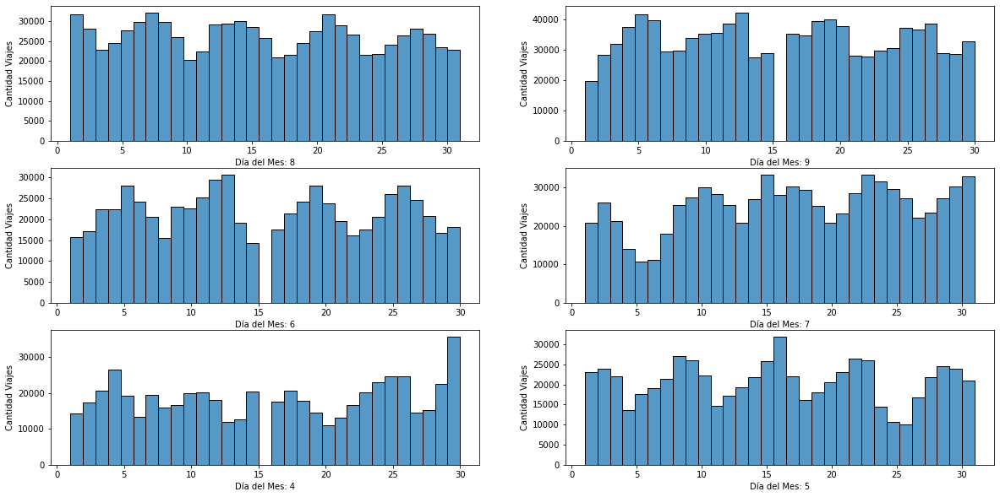

In [41]:
plt.figure(figsize=(20,10))
for i,mes in enumerate(df2014['Mes'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=df2014,x=df2014[df2014['Mes'] == mes]['DiaMes'],bins=31)
    plt.xlabel('Día del Mes: {}'.format(mes))
    plt.ylabel('Cantidad Viajes')

- Un día al mes no existen viajes, tendriamos que revidar para ver la posible razón y ver si afecta a nuestro análisis
- Durante los días de la semana aumenta la demanda, disminuyendo los fines de semana

In [42]:
#df2015.info()

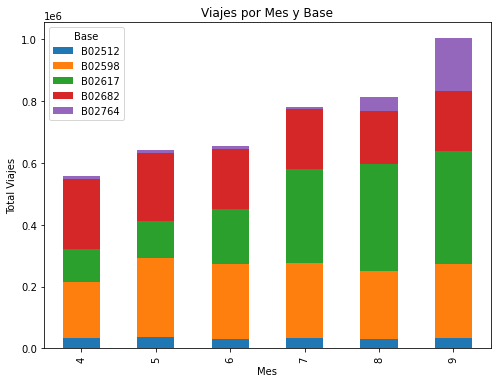

In [43]:
df2014.groupby(['Base','Mes']).count().unstack('Base')['Date/Time'].plot(kind='bar', figsize = (8,6),stacked=True)
plt.ylabel('Total Viajes')
plt.title('Viajes por Mes y Base');

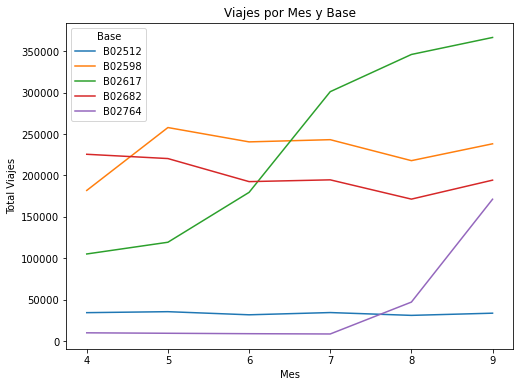

In [44]:
df2014.groupby(['Base','Mes']).count().unstack('Base')['Date/Time'].plot(figsize = (8,6))
plt.ylabel('Total Viajes')
plt.title('Viajes por Mes y Base');

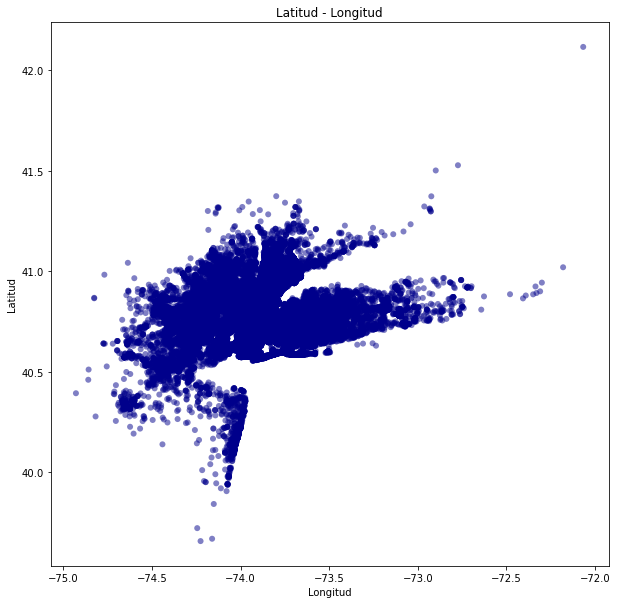

In [45]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='Lon',y='Lat',data=df2014,edgecolor='None',alpha=0.5,color='darkblue')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.title('Latitud - Longitud')
plt.show()

In [46]:
coordinates = df2014.groupby(['Lat', 'Lon'])['DiaSemana'].count().reset_index()
coordinates.columns=['Lat', 'Lon', 'no of trips']
coordinates

,Lat,Lon,no of trips
0,39.65690,-74.22580,1
1,39.66860,-74.16070,1
2,39.72140,-74.24460,1
3,39.84160,-74.15120,1
4,39.90550,-74.07910,1
...,...,...,...
574553,41.37300,-72.92370,1
574554,41.37370,-73.79880,1
574555,41.50160,-72.89870,1
574556,41.52760,-72.77340,1


In [47]:
#!pip install folium

In [48]:
from folium.plugins import HeatMap

In [49]:
import folium

In [50]:
basemap = folium.Map()

In [51]:
HeatMap(coordinates,zoom=5,radius=15).add_to(basemap)
basemap

### Clustering

In [52]:
df_lat_long = df2014[['Lat', 'Lon']]

In [53]:
scores = []

for i in range(2, 11):
    km = KMeans(n_clusters = i, random_state = 0)
    km.fit(df_lat_long)
    scores.append(km.inertia_)

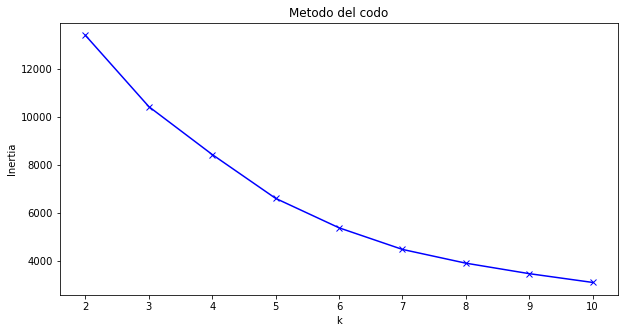

In [54]:
plt.figure(figsize=(10,5))
plt.plot(range(2,11), scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Metodo del codo')
plt.show()

In [55]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6, random_state=0)
kmeans.fit(df_lat_long)
y_kmeans = kmeans.predict(df_lat_long)

In [56]:
df2014['cluster'] = y_kmeans

In [57]:
df_cluster = pd.get_dummies(df2014['cluster'],prefix='cluster')
df2014['cluster0'] = df_cluster['cluster_0']
df2014['cluster1'] = df_cluster['cluster_1']
df2014['cluster2'] = df_cluster['cluster_2']
df2014['cluster3'] = df_cluster['cluster_3']
df2014['cluster4'] = df_cluster['cluster_4']
df2014['cluster5'] = df_cluster['cluster_5']

In [58]:
new_locacion = [(40.69884,-74.20232)]
kmeans.predict(new_locacion)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


array([4])

In [59]:
centroids = kmeans.cluster_centers_
centroids

array([[ 40.79683578, -73.87446955],
       [ 40.73130026, -73.99808718],
       [ 40.66552912, -73.76259427],
       [ 40.76628862, -73.97227178],
       [ 40.69883988, -74.20232073],
       [ 40.68749313, -73.9643531 ]])

In [60]:
clocation = pd.DataFrame()
clocation['Latitude'] = centroids[:,0]
clocation['Longitude'] = centroids[:,1]
clocation = clocation.reset_index(level=0)
clocation=clocation.rename(columns = {'index':'Cluster'})
clocation

,Cluster,Latitude,Longitude
0,0,40.79684,-73.87447
1,1,40.73130,-73.99809
2,2,40.66553,-73.76259
3,3,40.76629,-73.97227
4,4,40.69884,-74.20232
5,5,40.68749,-73.96435


In [61]:
df2014.shape

(4451746, 17)

In [62]:
df2014.tail()

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes,EsFDS,cluster,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5
652430,2014-05-31 23:45:00,40.73090,-74.00140,B02764,6,31,23,Sábado,5,1,1,0,1,0,0,0,0
652431,2014-05-31 23:52:00,40.75280,-73.97980,B02764,6,31,23,Sábado,5,1,3,0,0,0,1,0,0
652432,2014-05-31 23:55:00,40.71580,-73.95190,B02764,6,31,23,Sábado,5,1,5,0,0,0,0,0,1
652433,2014-05-31 23:56:00,40.69610,-73.89970,B02764,6,31,23,Sábado,5,1,5,0,0,0,0,0,1
652434,2014-05-31 23:59:00,40.73930,-73.99190,B02764,6,31,23,Sábado,5,1,1,0,1,0,0,0,0


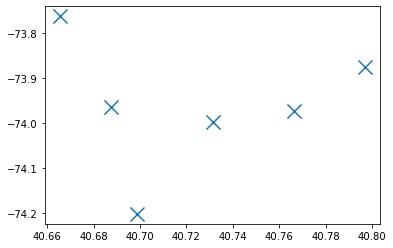

In [63]:
plt.scatter(clocation['Latitude'], clocation['Longitude'], marker = 'x', s = 200)
plt.show()

In [64]:
lat = clocation['Latitude']
lon = clocation['Longitude']
result = []
for i in range(len(lat)):
    result.append((lat[i], lon[i]))
print(result)

[(40.796835779465496, -73.87446954785453), (40.731300257621434, -73.99808718069711), (40.665529116286905, -73.76259426740864), (40.76628862281498, -73.97227178087341), (40.69883987793385, -74.20232072656285), (40.687493130651205, -73.96435310081301)]


In [65]:
result

[(40.796835779465496, -73.87446954785453),
 (40.731300257621434, -73.99808718069711),
 (40.665529116286905, -73.76259426740864),
 (40.76628862281498, -73.97227178087341),
 (40.69883987793385, -74.20232072656285),
 (40.687493130651205, -73.96435310081301)]

In [66]:
#centroid = clocation.values.tolist()
centroid = result
map = folium.Map(location=[40.79658011772687, -73.87341741832425], zoom_start = 10)

for point in range(0, len(centroid)):
    folium.Marker(
        centroid[point],
        #popup = centroid[point]).add_to(map)
        popup = point).add_to(map)
map

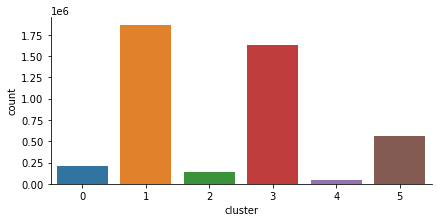

In [67]:
sns.catplot(data = df2014, x = 'cluster', kind = 'count', height = 3,aspect = 2)

# Entrenamiento y predicción 1

In [68]:
#df2014.to_excel('UBER_2014_PRES.xlsx', index=False)
#df_celulares = pd.read_excel('BD_Final.xlsx')

In [69]:
df2014.head()

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes,EsFDS,cluster,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5
0,2014-08-01 00:03:00,40.73660,-73.99060,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
1,2014-08-01 00:09:00,40.72600,-73.99180,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
2,2014-08-01 00:12:00,40.72090,-74.05070,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
3,2014-08-01 00:12:00,40.73870,-73.98560,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
4,2014-08-01 00:12:00,40.73230,-74.00770,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0


#### Creamos un DF con las variables que vamos a utilizar y se agrega la variable dependiente con la cantidad de viajes

In [70]:
#df = df2014.groupby(['DiaSemana', 'DiaMes', 'Hora', 'Mes', 'EsFDS', 'cluster0', 'cluster1', 'cluster2', 'cluster3', 'cluster4', 'cluster5'])['Date/Time'].count().reset_index()
df = df2014.groupby(['DiaSemana', 'DiaMes', 'Hora', 'Mes', 'EsFDS'])['Date/Time'].count().reset_index()
#df = df2014.groupby(['DiaSemana', 'DiaMes', 'Hora', 'Mes'])['Date/Time'].count().reset_index()
df = df.rename(columns={'Date/Time':'Trips'})
df.head()

,DiaSemana,DiaMes,Hora,Mes,EsFDS,Trips
0,1,1,0,9,0,682
1,1,1,1,9,0,480
2,1,1,2,9,0,356
3,1,1,3,9,0,329
4,1,1,4,9,0,260


Cuanto se correlaciona cada variable independiente con la variable dependiente.

In [71]:
corr_matrix = df.corr()
corr_matrix["Trips"].sort_values(ascending=False)

Trips        1.00000
Hora         0.63077
Mes          0.30296
DiaMes       0.03403
DiaSemana   -0.01757
EsFDS       -0.11982
Name: Trips, dtype: float64

#### Separamos el DF en variables independientes (X) y dependiente (y)

In [72]:
X = df.iloc[:, 0:5] ## Multivariable
#X = df[['Hora', 'Mes', 'DiaMes']]
#X = df['Hora'] ## Simple
y = df['Trips']
print(X.shape)
print(y.shape)
print(X.columns)

(4391, 5)
(4391,)
Index(['DiaSemana', 'DiaMes', 'Hora', 'Mes', 'EsFDS'], dtype='object')


#### Separamos los datos en entrenamiento y testeo

In [101]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3 , random_state=42)
print("X_train ",X_train.shape)
print("y_train ",y_train.shape)
print("X_test ",X_test.shape)
print("y_test ",y_test.shape)

X_train  (3073, 5)
y_train  (3073,)
X_test  (1318, 5)
y_test  (1318,)


In [74]:
## pasar a arreglo en caso de la regresion simple
#X_train_arr = np.asarray(X_train)
#X_test_arr = np.asarray(X_test)

#### Entrenamos el modelo de regresión y hacemos predicción

In [75]:
reg_model = LinearRegression()
reg_model = reg_model.fit(X_train, y_train)
#predict_train = reg_model.predict(X_train)
predict_test = reg_model.predict(X_test)
## Simple
#reg = reg.fit(X_train_arr[:,None], y_train)
#y_pred = reg.predict(X_test_arr[:,None])

In [76]:
#print('Regresion Lineal R2 Train": %.4f' % reg_model.score(X_train, y_train))
print('Regresion Lineal R2 Test": %.4f' % reg_model.score(X_test, y_test))
#print(reg.score(X_train_arr[:,None], y_train))
#print(reg.score(X_test_arr[:,None], y_test))

Regresion Lineal R2 Test": 0.5313


El 52,29 % de la variabilidad en y puede explicarse usando X

In [77]:
print('Valor de las pendientes o coeficientes "a":')
print(reg_model.coef_)

Valor de las pendientes o coeficientes "a":
[  69.57822438    2.31115706   56.91603012  115.3118231  -425.83191415]


In [78]:
print('Valor de la intersección o coeficiente "b":')
print(reg_model.intercept_)

Valor de la intersección o coeficiente "b":
-578.7996696618496


# Entrenamiento y predicción 2 Escalados

## Datos Escalados

In [79]:
scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.fit_transform(X_test)

In [80]:
reg_model2 = LinearRegression()
reg_model2 = reg_model2.fit(X_train_sc, y_train)
#predict_train = reg_model.predict(X_train_sc)
predict_test = reg_model2.predict(X_test_sc)

Evaluación

In [81]:
print('Score del modelo datos escalados:')
#print("train scaled Score: ",reg_model.score(X_train_sc, y_train))
print("test scaled Score: ",reg_model2.score(X_test_sc, y_test))

Score del modelo datos escalados:
test scaled Score:  0.5316138115216007


Evaluación sobre datos de test

In [82]:
r2 = r2_score(y_test, predict_test)
mae = mean_absolute_error(y_test, predict_test)
mse = mean_squared_error(y_test, predict_test)
print('R2    MAE  MSE')
print('{:.2f} {:.2f} {:.2f}'.format(r2, mae, mse))

R2    MAE  MSE
0.53 321.64 183978.61


Evaluación sobre datos de test

In [83]:
#r2 = r2_score(y_train, predict_train)
#mae = mean_absolute_error(y_train, predict_train)
#mse = mean_squared_error(y_train, predict_train)
#print('R2    MAE  MSE')
#print('{:.2f} {:.2f} {:.2f}'.format(r2, mae, mse))

# Entrenamiento y predicción 3 - Escalado y Nuevas variables

In [95]:
df_lluvias = pd.read_excel("Lluvia.xlsx")
df_lluvias.head()

,año,mes,Dia,hora,New York,Lluvia,temp
0,2014,4,1,0,scattered clouds,0,282.96000
1,2014,4,1,1,scattered clouds,0,281.83000
2,2014,4,1,2,scattered clouds,0,279.84000
3,2014,4,1,3,few clouds,0,278.07000
4,2014,4,1,4,sky is clear,0,277.19000


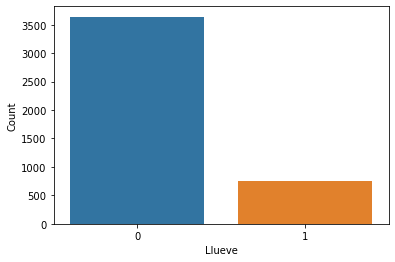

In [100]:
plt.figure(figsize=(6,4))
#order_day = ['Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
sns.countplot(data=df_lluvias,x='Lluvia')
plt.ylabel('Count')
plt.xlabel('Llueve')
plt.show()

In [85]:
df2014.head()

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes,EsFDS,cluster,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5
0,2014-08-01 00:03:00,40.73660,-73.99060,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
1,2014-08-01 00:09:00,40.72600,-73.99180,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
2,2014-08-01 00:12:00,40.72090,-74.05070,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
3,2014-08-01 00:12:00,40.73870,-73.98560,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0
4,2014-08-01 00:12:00,40.73230,-74.00770,B02512,5,1,0,Viernes,8,0,1,0,1,0,0,0,0


In [86]:
print(df2014.shape)
print(df_lluvias.shape)

(4451746, 17)
(4392, 7)


In [87]:
X2 = pd.merge(df2014, df_lluvias, how='left', left_on=['Hora', 'Mes','DiaMes'], right_on=['hora', 'mes', 'Dia'])
X2= X2.drop(['año', 'mes', 'Dia', 'hora', 'New York'], axis=1)

In [88]:
#X2.to_excel('X2_lluvia.xlsx', index=False)

In [89]:
print(X2.shape)
print()
print(X2.info())

(4451746, 19)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4451746 entries, 0 to 4451745
Data columns (total 19 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date/Time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
 4   DiaSemana  int64         
 5   DiaMes     int64         
 6   Hora       int64         
 7   DiaNombre  object        
 8   Mes        int64         
 9   EsFDS      int64         
 10  cluster    int32         
 11  cluster0   uint8         
 12  cluster1   uint8         
 13  cluster2   uint8         
 14  cluster3   uint8         
 15  cluster4   uint8         
 16  cluster5   uint8         
 17  Lluvia     int64         
 18  temp       float64       
dtypes: datetime64[ns](1), float64(3), int32(1), int64(6), object(2), uint8(6)
memory usage: 484.0+ MB
None


In [92]:
df2 = X2.groupby(['DiaSemana', 'DiaMes', 'Hora', 'Mes', 'EsFDS', 'Lluvia', 'temp'])['Date/Time'].count().reset_index()
#df2 = X2.groupby(['DiaSemana', 'DiaMes', 'Hora', 'Mes', 'EsFDS', 'Lluvia', 'temp','cluster0', 'cluster1', 'cluster2', 'cluster3', 'cluster4', 'cluster5'])['Date/Time'].count().reset_index()
df2 = df2.rename(columns={'Date/Time':'Trips'})
df2.head()

,DiaSemana,DiaMes,Hora,Mes,EsFDS,Lluvia,temp,Trips
0,1,1,0,9,0,0,298.01000,682
1,1,1,1,9,0,0,297.23000,480
2,1,1,2,9,0,0,297.23000,356
3,1,1,3,9,0,0,296.81000,329
4,1,1,4,9,0,0,296.72000,260


In [93]:
#df2['cluster0'] = df2['cluster0'].astype(int)
#df2['cluster1'] = df2['cluster1'].astype(int)
#df2['cluster2'] = df2['cluster2'].astype(int)
#df2['cluster3'] = df2['cluster3'].astype(int)
#df2['cluster4'] = df2['cluster4'].astype(int)
#df2['cluster5'] = df2['cluster5'].astype(int)

In [ ]:
df2.info()

In [ ]:
df2.to_stata('DFdatos2.dta')

In [ ]:
datos_2=X2.groupby (['DiaMes','DiaSemana','Hora','DiaLaboral', 'Lluvia', 'temp']). agg ({'Date/Time': ['count']}). reset_index ()

In [ ]:
corr_matrix = df2.corr()
corr_matrix["Trips"].sort_values(ascending=False)

In [ ]:
X3 = df2.iloc[:, 0:13] ## Multivariable
#X = df[['Hora', 'Mes', 'DiaMes']]
#X = df['Hora'] ## Simple
y3 = df2['Trips']
print(X3.shape)
print(y3.shape)
print(X3.columns)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X3, y3, test_size=0.3, random_state=42)
print("X_train ",X_train.shape)
print("y_train ",y_train.shape)
print("X_test ",X_test.shape)
print("y_test ",y_test.shape)

In [ ]:
scaler = StandardScaler()
X_train_sc_f = scaler.fit_transform(X_train)
X_test_sc_f = scaler.fit_transform(X_test)

In [ ]:
reg_model3 = LinearRegression()
reg_model3 = reg_model3.fit(X_train_sc_f, y_train)
#predict_train = reg_model.predict(X_train_sc)
predict_test = reg_model3.predict(X_test_sc_f)

In [ ]:
#print('Regresion Lineal R2 Train": %.4f' % reg_model.score(X_train_sc, y_train))
print('Regresion Lineal R2 Test": %.4f' % reg_model3.score(X_test_sc_f, y_test))

#### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor(random_state=42)
forest_reg.fit(X_train_sc_f, y_train)

In [ ]:
print('Random Forest R squared": %.4f' % forest_reg.score(X_test_sc_f, y_test))

In [ ]:
#print('Random Forest R squared": %.4f' % forest_reg.score(X_test, y_test))

#### transformar lat y long a zipcode

In [ ]:
#df_uber_Apr = pd.read_csv("uber-raw-data-apr14.csv")

In [ ]:
#df_uber_Apr['Lat'] = df_uber_Apr['Lat'].round(3)
#df_uber_Apr['Lon'] = df_uber_Apr['Lon'].round(3)

In [ ]:
#df_uber_Apr.head()

In [ ]:
#def get_zipcode(df, geolocator, lat_field, lon_field):
#    #print(df[lat_field],df[lon_field])
#    location = geolocator.reverse((df[lat_field], df[lon_field]))
#    return location.raw['address'].get('postcode')

In [ ]:
#geolocator = geopy.Nominatim(user_agent='check_1')
#df_zip = df_uber_Apr[['Lat', 'Lon']]
#zipcodes = df_zip.apply(get_zipcode, axis=1, geolocator=geolocator, lat_field='Lat', lon_field='Lon')

In [ ]:
#df_zip.head()

In [ ]:
#geolocalizador = geopy.Nominatim(user_agent='check_1')
#ubicacion = geolocalizador.reverse("40.739, -73.959")
#print(ubicacion.address)
#print(ubicacion.raw['address']['postcode'])
#print(ubicacion.raw['address'].get('postcode'))
#print(ubicacion.raw['address'].get('state'))

In [548]:
#zipcodes.shape